In [60]:
import pandas as pd
import numpy as np
from glob import glob
import cv2

import matplotlib.pyplot as plt
from tqdm import tqdm

In [3]:
df_original = pd.read_csv("/workspace/data/df_train_study_level_npy640_3_w_bbox.csv")
df_original.head()

,id,x,y,w,h,study_id,image_id,have_box,dicom_path,Negative for Pneumonia,Typical Appearance,Indeterminate Appearance,Atypical Appearance,cv,npy_path,is_none
0,04f41a8958f7_image,688.06282,966.82563,518.48212,1130.17438,6e4a0581cefe,04f41a8958f7,1,/workspace/data/train/6e4a0581cefe/018ed20fa9c...,0,1,0,0,0,/workspace/data/train_640_2/04f41a8958f7.png,0
1,04f41a8958f7_image,2482.36026,1636.77436,652.47168,652.47168,6e4a0581cefe,04f41a8958f7,1,/workspace/data/train/6e4a0581cefe/018ed20fa9c...,0,1,0,0,0,/workspace/data/train_640_2/04f41a8958f7.png,0
2,04f41a8958f7_image,1235.67308,1628.03597,509.74353,559.26147,6e4a0581cefe,04f41a8958f7,1,/workspace/data/train/6e4a0581cefe/018ed20fa9c...,0,1,0,0,0,/workspace/data/train_640_2/04f41a8958f7.png,0
3,0572ef0d0c1a_image,1818.65264,233.50598,613.04395,839.53784,adbfed2da701,0572ef0d0c1a,1,/workspace/data/train/adbfed2da701/e2fa197720c...,0,1,0,0,3,/workspace/data/train_640_2/0572ef0d0c1a.png,0
4,0572ef0d0c1a_image,598.60492,61.37052,688.54175,881.81674,adbfed2da701,0572ef0d0c1a,1,/workspace/data/train/adbfed2da701/e2fa197720c...,0,1,0,0,3,/workspace/data/train_640_2/0572ef0d0c1a.png,0


In [6]:
bimcv_path = glob('/workspace/data/external/bimcv/covid19_posi_dump/*png')
record_path = glob('/workspace/data/external/record/MIDRC-RICORD/MIDRC-RICORD/*jpg')

In [7]:
print(len(bimcv_path))
print(len(record_path))

16840
1022


In [52]:
record_img_array = []
for i in tqdm(range(len(record_path))):
    img_hash = cv2.imread(record_path[i], cv2.IMREAD_GRAYSCALE)
    img_hash = cv2.resize(img_hash, (128, 128))
    record_img_array.append(img_hash.flatten())
#     record_img_hash[record_path[i]] = img_hash.flatten()
record_img_array = np.array(record_img_array)

100%|██████████| 1022/1022 [00:54<00:00, 18.81it/s]


In [53]:
bimcv_img_array = []
for i in tqdm(range(len(bimcv_path))):
    img_hash = cv2.imread(bimcv_path[i], cv2.IMREAD_GRAYSCALE)
    img_hash = cv2.resize(img_hash, (128, 128))
    bimcv_img_array.append(img_hash.flatten())
bimcv_img_array = np.array(bimcv_img_array)

100%|██████████| 16840/16840 [00:33<00:00, 508.26it/s]


In [54]:
original_img_array = []

for i in tqdm(range(len(df_original))):
    img_hash = cv2.imread(df_original.npy_path[i], cv2.IMREAD_GRAYSCALE)
    img_hash = cv2.resize(img_hash, (128, 128))
    original_img_array.append(img_hash.flatten())
original_img_array = np.array(original_img_array)

100%|██████████| 9676/9676 [08:44<00:00, 18.46it/s]


In [55]:
record_img_array.shape

(1022, 16384)

In [56]:
record_img_array.shape

(1022, 16384)

In [57]:
for i in range(100):

    one_image_from_original = original_img_array[i]

    r = np.abs(record_img_array - one_image_from_original).mean(1)
    b = np.abs(bimcv_img_array - one_image_from_original).mean(1)
    
    print('#'*10)
    print(f'r : {np.sort(r[:5])}, b : {np.sort(b[:5])}')

##########
r : [ 77.70037842  79.07116699  86.43963623  94.97857666 101.25628662], b : [ 84.78894043  98.13671875 104.29711914 105.66540527 116.0892334 ]
##########
r : [ 77.70037842  79.07116699  86.43963623  94.97857666 101.25628662], b : [ 84.78894043  98.13671875 104.29711914 105.66540527 116.0892334 ]
##########
r : [ 77.70037842  79.07116699  86.43963623  94.97857666 101.25628662], b : [ 84.78894043  98.13671875 104.29711914 105.66540527 116.0892334 ]
##########
r : [156.81951904 158.99627686 160.53405762 167.42230225 170.48834229], b : [138.11462402 140.60375977 150.1439209  152.81433105 153.88085938]
##########
r : [156.81951904 158.99627686 160.53405762 167.42230225 170.48834229], b : [138.11462402 140.60375977 150.1439209  152.81433105 153.88085938]
##########
r : [111.13653564 120.40985107 129.32818604 135.11602783 147.17431641], b : [ 92.59863281 102.68896484 127.36230469 149.19299316 160.79089355]
##########
r : [111.13653564 120.40985107 129.32818604 135.11602783 147.1743

In [58]:
b

array([ 93.83380127, 118.69659424, 113.35089111, ..., 102.58612061,
       143.21936035,  98.57318115])

<Figure size 432x288 with 0 Axes>

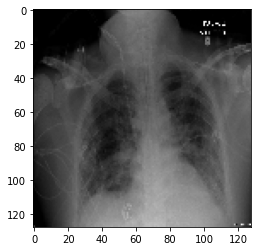

In [63]:
plt.gray()

plt.figure()
plt.imshow(original_img_array[0].reshape(128, 128))
plt.show()

In [70]:
np.sort(np.abs(record_img_array - original_img_array[0]).mean(1))

array([ 43.55383301,  53.46612549,  56.97576904, ..., 139.84350586,
       140.46655273, 147.1574707 ])

In [68]:
ind = np.abs(record_img_array - original_img_array[0]).mean(1).argsort()[0]

array([ 0,  0,  0, ..., 42, 40, 24], dtype=uint8)

In [69]:
np.abs(record_img_array[ind] - original_img_array[0]).mean()

43.5538330078125

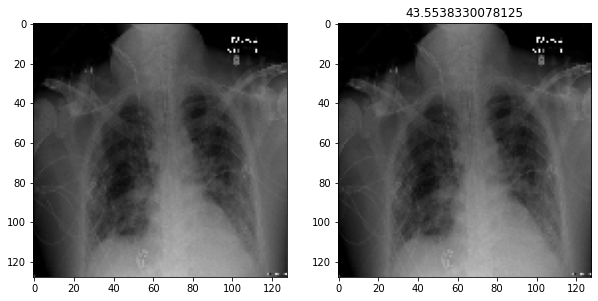

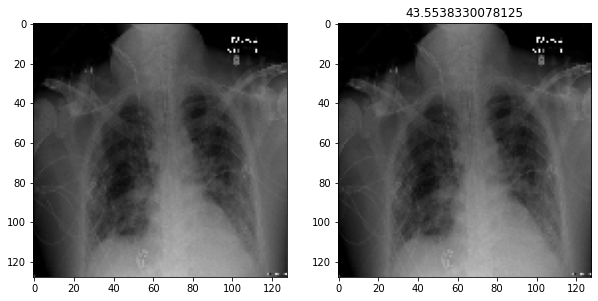

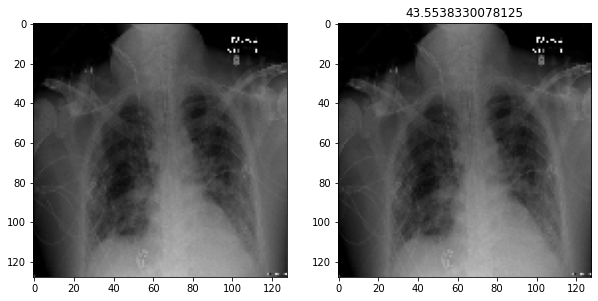

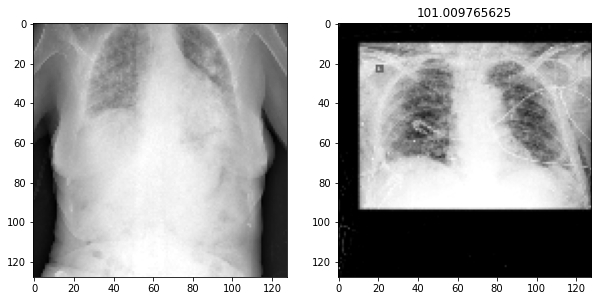

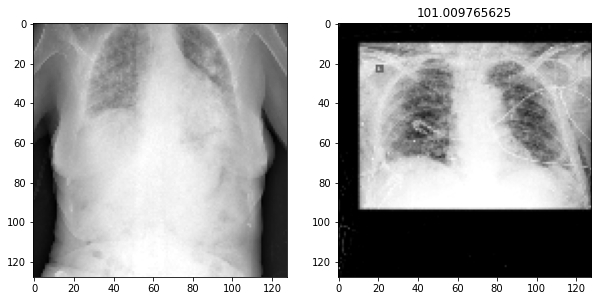

...

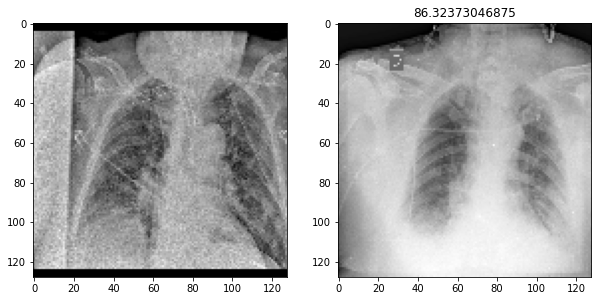

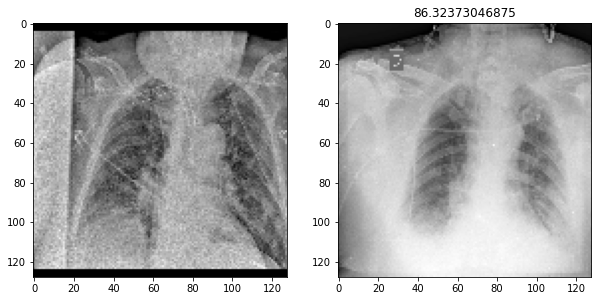

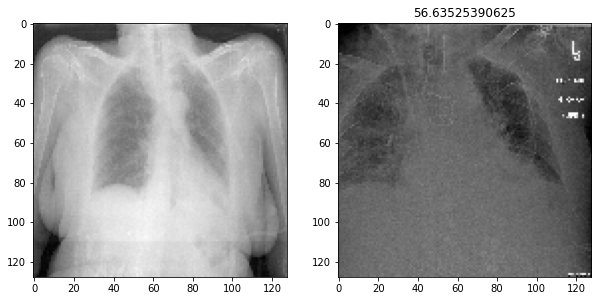

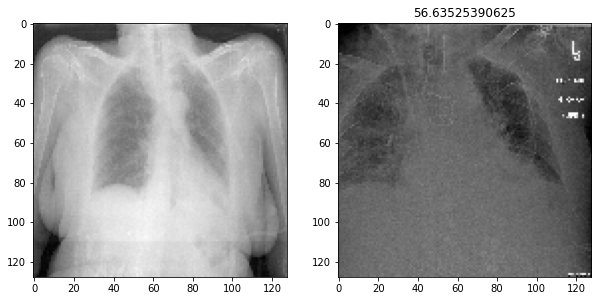

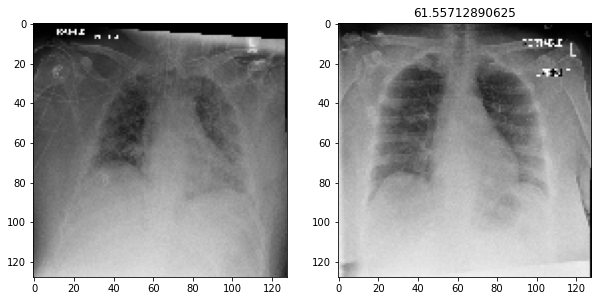

In [83]:
for original_img_num in range(20):

    ind = np.abs(record_img_array - original_img_array[original_img_num]).mean(1).argsort()[0]

    plt.figure(figsize=(10, 12))

    plt.subplot(1, 2, 1)
    plt.imshow(original_img_array[original_img_num].reshape(128, 128))

    plt.subplot(1, 2, 2)
    plt.imshow(record_img_array[ind].reshape(128, 128))
    plt.title(np.abs(record_img_array - original_img_array[original_img_num]).mean(1).min())
    plt.show()

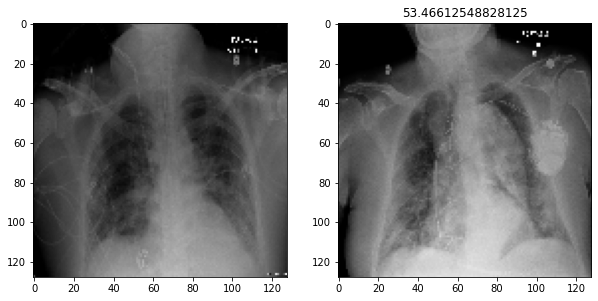

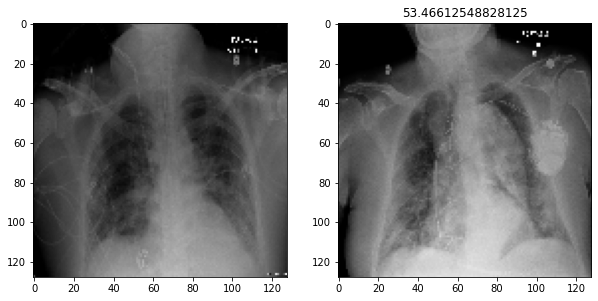

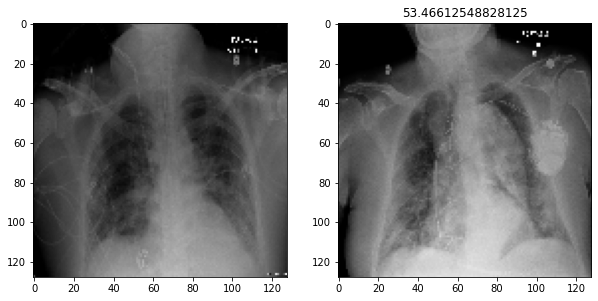

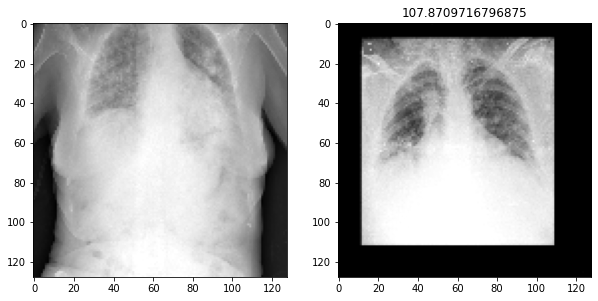

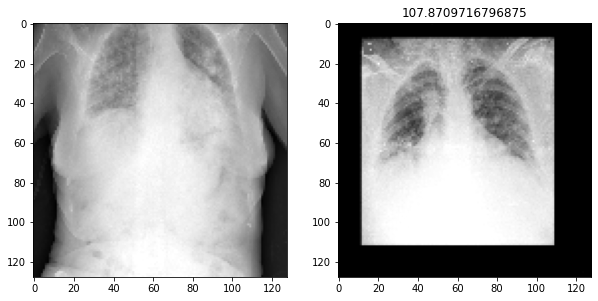

...

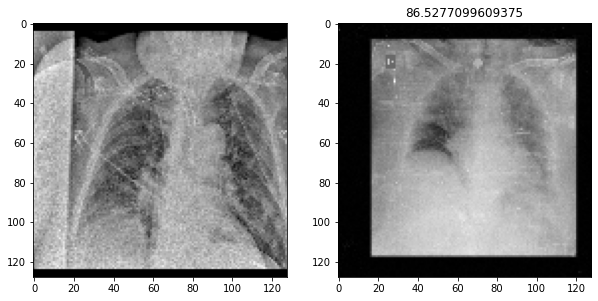

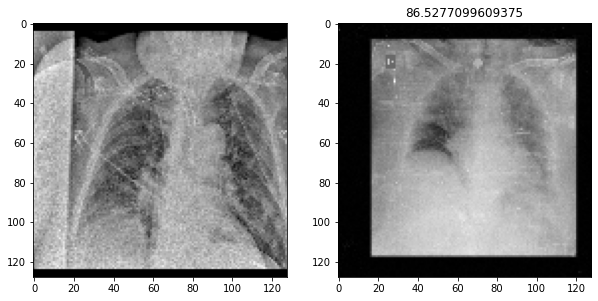

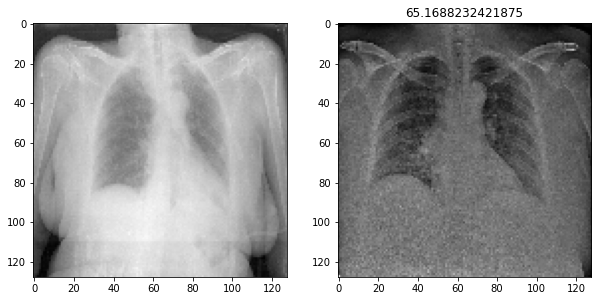

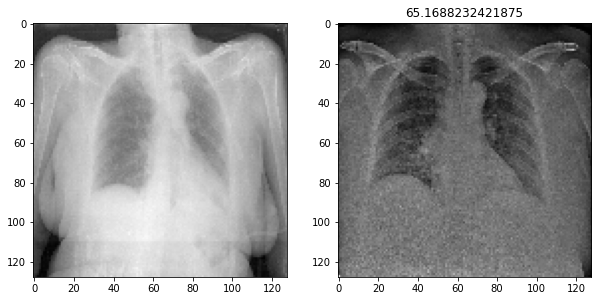

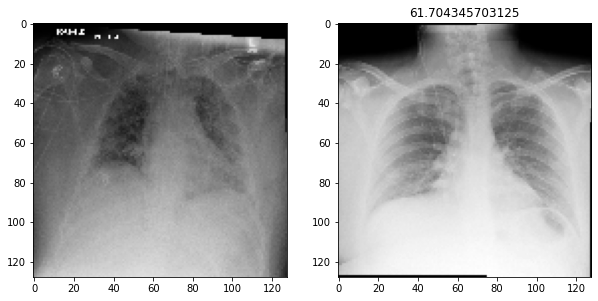

In [85]:
for original_img_num in range(20):

    ind = np.abs(record_img_array - original_img_array[original_img_num]).mean(1).argsort()[1]

    plt.figure(figsize=(10, 12))

    plt.subplot(1, 2, 1)
    plt.imshow(original_img_array[original_img_num].reshape(128, 128))

    plt.subplot(1, 2, 2)
    plt.imshow(record_img_array[ind].reshape(128, 128))
    plt.title(np.abs(record_img_array[ind] - original_img_array[original_img_num]).mean())
    plt.show()

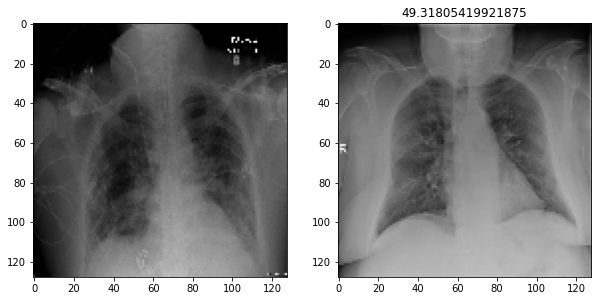

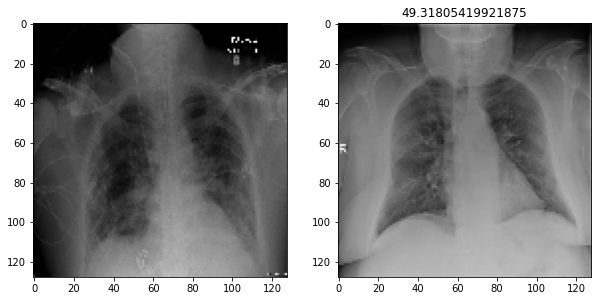

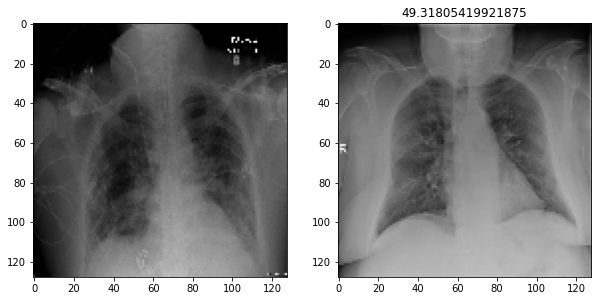

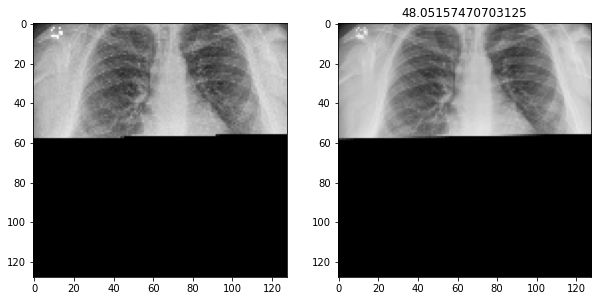

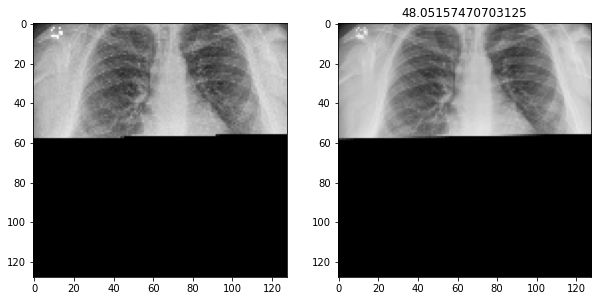

...

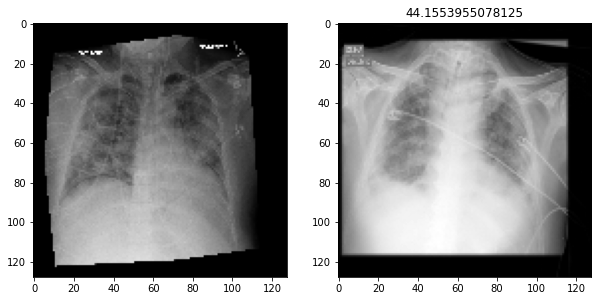

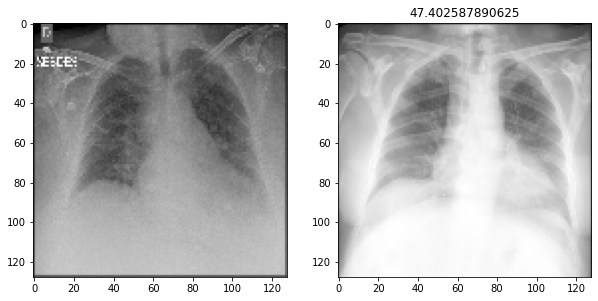

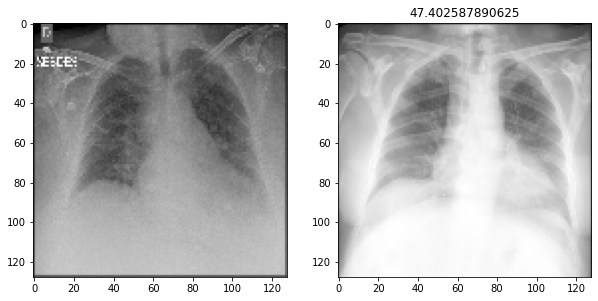

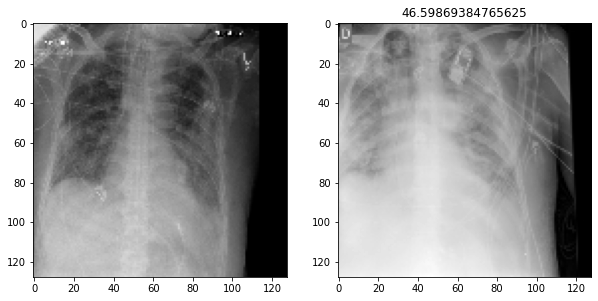

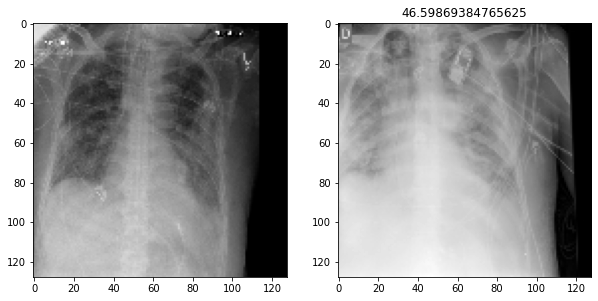

In [89]:
for original_img_num in range(200):
    
    if np.abs(bimcv_img_array - original_img_array[original_img_num]).mean(1).min() < 50:

        ind = np.abs(bimcv_img_array - original_img_array[original_img_num]).mean(1).argsort()[0]

        plt.figure(figsize=(10, 12))

        plt.subplot(1, 2, 1)
        plt.imshow(original_img_array[original_img_num].reshape(128, 128))

        plt.subplot(1, 2, 2)
        plt.imshow(bimcv_img_array[ind].reshape(128, 128))
        plt.title(np.abs(bimcv_img_array - original_img_array[original_img_num]).mean(1).min())
        plt.show()